In [1]:
import numpy as np
import pandas as pd 

import os
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential,Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization,Input,UpSampling2D
from keras.callbacks import ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import regularizers
import cv2
from tqdm import tqdm
import random
from skimage.io import imread
from skimage.transform import resize
import numpy as np
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import *
from sklearn.cluster import KMeans
from nltk.corpus import stopwords
from keras.utils.vis_utils import plot_model
from IPython.display import Image
from keras import backend as K
import nltk
import re
from sentence_transformers import SentenceTransformer
from sklearn.metrics import pairwise_distances

In [2]:
def cleaner(text):
    text=text.lower()
    for c in "\n":
        text = text.replace(c," ")
    abrev = re.compile(r"'\b\w+\b")
    text = abrev.sub(r'',text).strip()
    
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'#\S+', '', text)
    text = re.sub(r'@\S+', '', text)
    
    tag = re.compile(r'<.*?>')
    text = tag.sub(r' ',text).strip()
    for c in "!#$%&\°'()*+,-./:;<=>?@[\\]^_{|}~`ø÷´¨\"":
        text = text.replace(c,"")
        
    #text = " ".join([lemmatizer.lemmatize(word) for word in text.split()])                          
    text = " ".join([word for word in str(text).split() if word not in stopwords])
    return text

In [16]:
def preprocess_img(img_path):
    dsize = (img_width, img_height)
    new_image=cv2.imread(img_path)
    new_image=cv2.resize(new_image,dsize)  
    new_image=np.expand_dims(new_image,axis=0)
    new_image = new_image*(1./255)
    new_image=np.flip(new_image,axis=-1)
    return new_image

In [2]:
def sorting(tup, reverse=True):
    return(sorted(tup, key = lambda x: x[0],reverse=reverse))

In [5]:
def random_rotate_and_flip(arr):
    
    num_transf = random.randint(0, 3)
    for i in range(num_transf):
        arr = np.rot90(arr)
        
    flip = random.randint(0, 1)
    if(flip):
        flip_axis = random.randint(0, 1)
        arr = np.flip(arr, axis=flip_axis)
    return arr

In [6]:
class CustomDataGenerator(Sequence):
    def __init__(self, x_set, embeddings, batch_size, width, height):
        self.x = x_set
        self.batch_size = batch_size
        self.width  = width
        self.height = height
        self.embeddings = embeddings
        
    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):

        batch_ = self.x[idx * self.batch_size : (idx + 1) * self.batch_size]
        embed_batch_ = self.embeddings[idx * self.batch_size : (idx + 1) * self.batch_size]
        
        return batch_, [batch_, embed_batch_]
    
    
class CustomDataGenerator2(Sequence):
    def __init__(self, x_set, embeddings, batch_size, width, height):
        self.x = x_set
        self.batch_size = batch_size
        self.width  = width
        self.height = height
        self.embeddings = embeddings
        
    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):

        batch_ = self.x[idx * self.batch_size : (idx + 1) * self.batch_size]
        embed_batch_ = self.embeddings[idx * self.batch_size : (idx + 1) * self.batch_size]
        
        batch_ = np.array([random_rotate_and_flip(x) for x in batch_])
        
        return batch_, embed_batch_

In [18]:
img_width = 256
img_height = 256

In [3]:
descriptions = pd.read_csv('descriptions.csv')

In [4]:
model_t = SentenceTransformer('distiluse-base-multilingual-cased')

In [5]:
descriptions_embeddings = model_t.encode(descriptions[" description"].values)

In [152]:
input_img = keras.Input(shape=(img_width, img_height, 3))
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = layers.MaxPooling2D((2, 2), padding='same', name="encoded")(x)


y = layers.Dense(units=1024, activation='tanh')(encoded)
y = layers.Dense(units=2, activation='tanh')(y)
projection = layers.Flatten(name='projection')(y)

# LATENT SPACE
latentSize = (16,16,16)

# DECODER

direct_input = keras.Input(shape=latentSize)
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(direct_input)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation='relu',padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu',padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu',padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(3, (2, 2), activation='sigmoid', padding='same', name="decoded")(x)

encoder = keras.Model(input_img, encoded)
decoder = keras.Model(direct_input, decoded, name="decoder")
projector = keras.Model(encoded, projection)
autoencoder = keras.Model(input_img, [decoder(encoded), projection])
autoencoder.compile(optimizer=tf.keras.optimizers.Nadam(), loss=['binary_crossentropy', 'cosine_similarity'], metrics=[['accuracy'], ['cosine_similarity']])

In [153]:
autoencoder.summary()

Model: "model_25"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_65 (Conv2D)             (None, 256, 256, 12  3584        ['input_22[0][0]']               
                                8)                                                                
                                                                                                  
 max_pooling2d_25 (MaxPooling2D  (None, 128, 128, 12  0          ['conv2d_65[0][0]']              
 )                              8)                                                         

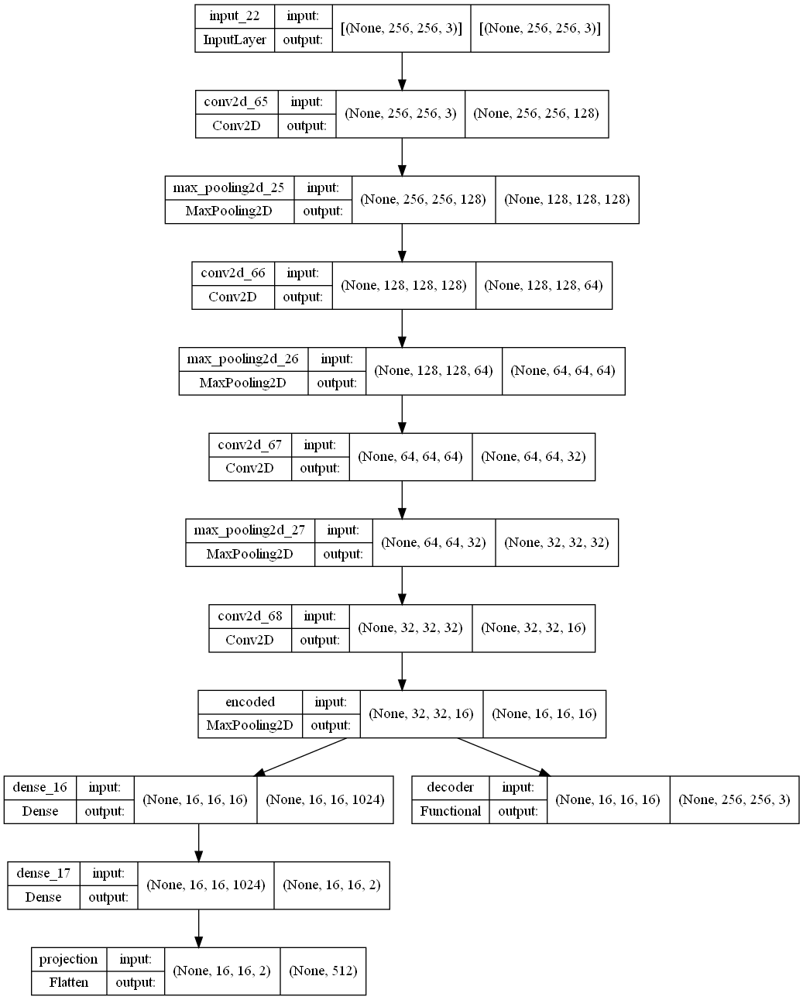

In [154]:
plot_model(autoencoder, show_shapes=True)

In [11]:
X = []
for file in tqdm(descriptions[" ID"].values):
    X.append(preprocess_img('dataset/database-full/' + file)[0])

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:06<00:00, 151.75it/s]


In [12]:
X = np.array(X)

In [155]:
data_gen = CustomDataGenerator(X, descriptions_embeddings, 4, img_width, img_height)

In [156]:
autoencoder.fit(data_gen, verbose=1, epochs=10)

Epoch 1/10
250/250 [==============================] - 33s 122ms/step - loss: 0.5866 - decoder_loss: 0.6019 - projection_loss: -0.0153 - decoder_accuracy: 0.5027 - projection_cosine_similarity: 0.0153
Epoch 2/10
250/250 [==============================] - 31s 122ms/step - loss: 0.5362 - decoder_loss: 0.5601 - projection_loss: -0.0239 - decoder_accuracy: 0.5064 - projection_cosine_similarity: 0.0239
Epoch 3/10
250/250 [==============================] - 31s 122ms/step - loss: 0.5281 - decoder_loss: 0.5546 - projection_loss: -0.0265 - decoder_accuracy: 0.4928 - projection_cosine_similarity: 0.0265
Epoch 4/10
250/250 [==============================] - 31s 122ms/step - loss: 0.5196 - decoder_loss: 0.5488 - projection_loss: -0.0293 - decoder_accuracy: 0.5463 - projection_cosine_similarity: 0.0293
Epoch 5/10
250/250 [==============================] - 31s 122ms/step - loss: 0.5110 - decoder_loss: 0.5440 - projection_loss: -0.0330 - decoder_accuracy: 0.5919 - projection_cosine_similarity: 0.0330


In [152]:
aux_embed = (descriptions_embeddings - descriptions_embeddings.mean()) / descriptions_embeddings.std()
embed_gen = CustomDataGenerator2(X, aux_embed, 4, img_width, img_height)

In [154]:
input_img2 = keras.Input(shape=(img_width, img_height, 3))
x2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_img2)
x2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.MaxPooling2D((2, 2), padding='same')(x2)

x2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.MaxPooling2D((2, 2), padding='same')(x2)

x2 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.MaxPooling2D((2, 2), padding='same')(x2)

x2 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x2)
x2 = layers.MaxPooling2D((2, 2), padding='same')(x2)

x2 = layers.Flatten()(x2)
x2 = layers.Dropout(.30)(x2)
x2 = layers.Dense(units=128, activation='tanh')(x2)
x2 = layers.Dense(units=128)(x2)
x2 = layers.BatchNormalization()(x2)
x2 = layers.Dense(units=128)(x2)
#x2 = layers.Dense(units=512, activation='tanh')(x2)
projection2 = layers.Dense(units=512, activation='tanh', name='projection')(x2)

projector2 = keras.Model(input_img2, projection2)

In [155]:
projector2.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_60 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_61 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_62 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 conv2d_63 (Conv2D)          (None, 128, 128, 128)     147584    
                                                           

In [156]:
projector2.compile(optimizer=tf.keras.optimizers.Ftrl(), loss=[tf.keras.losses.CosineSimilarity()], metrics=['cosine_similarity'])

In [165]:
projector2.fit(embed_gen, verbose = 1, epochs = 10)

Epoch 1/10
250/250 [==============================] - 60s 234ms/step - loss: 101.4056 - cosine_similarity: 0.2975
Epoch 2/10
250/250 [==============================] - 59s 235ms/step - loss: 100.7367 - cosine_similarity: 0.3152
Epoch 3/10
250/250 [==============================] - 58s 232ms/step - loss: 100.7367 - cosine_similarity: 0.3050
Epoch 4/10
250/250 [==============================] - 58s 232ms/step - loss: 100.2559 - cosine_similarity: 0.2976
Epoch 5/10
250/250 [==============================] - 58s 231ms/step - loss: 100.1364 - cosine_similarity: 0.2919
Epoch 6/10
250/250 [==============================] - 58s 232ms/step - loss: 100.1648 - cosine_similarity: 0.2881
Epoch 7/10
250/250 [==============================] - 58s 231ms/step - loss: 99.9789 - cosine_similarity: 0.2851
Epoch 8/10
250/250 [==============================] - 58s 231ms/step - loss: 100.1009 - cosine_similarity: 0.2821
Epoch 9/10
250/250 [==============================] - 58s 232ms/step - loss: 99.9468 - co

# Embedding of data base

In [41]:
full_data_gen = ImageDataGenerator(rescale=1./255)
img_data_gen  = full_data_gen.flow_from_directory('./dataset', target_size=(img_width, img_height), batch_size=4, shuffle=False, class_mode='input')

Found 31783 images belonging to 1 classes.


In [42]:
latents = encoder.predict(img_data_gen, verbose = 1)

7946/7946 [==============================] - 186s 23ms/step


In [43]:
flattened = np.array([x.flatten() for x in latents])

# Load examples of retrievals

In [19]:
example = pd.read_csv('examples_of_retrieval.csv', sep="\t")
retrievals=[]
retrievals.append([x.replace(" ", "") for x in example.columns[0].split(",")])
for i in example.index:
    retrievals.append([x.replace(" ", "") for x in example.iloc[i].values[0].split(",")])

In [20]:
loaded=[]
for group in retrievals[:6]:
    for i in group:
        loaded.append('dataset/database-full/ '+i)
loaded = pd.DataFrame({'paths': loaded})

In [27]:
test_data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_gen = test_data_gen.flow_from_dataframe(loaded, x_col='paths', directory=None, target_size=(img_width, img_height), color_mode="rgb", class_mode="input", batch_size=4, shuffle=False)

Found 551 validated image filenames.


In [47]:
loaded_latents = encoder.predict(test_gen, verbose=1)

138/138 [==============================] - 3s 19ms/step


# KMeans examples of retrievals

In [77]:
to_fit = np.array([x.flatten() for x in loaded_latents])

In [78]:
kmeans = KMeans(n_clusters=12).fit(to_fit)

In [79]:
final_df = pd.DataFrame({'paths': loaded.paths, 'cluster': kmeans.labels_})

In [85]:
final_df[final_df.cluster == 3].shape

(22, 2)

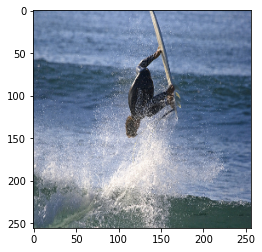

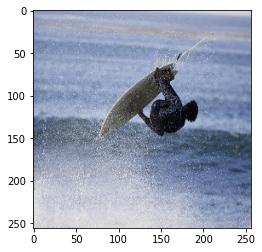

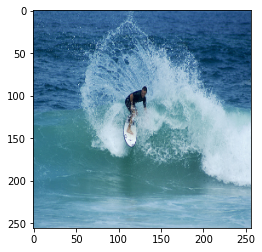

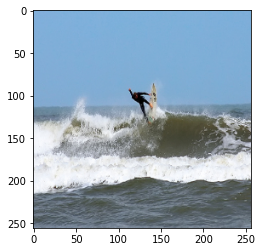

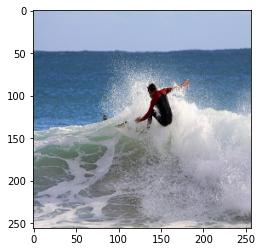

...

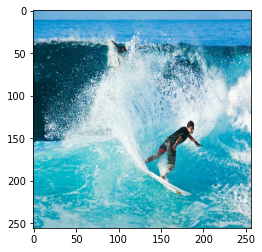

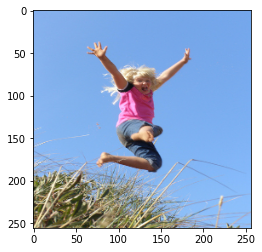

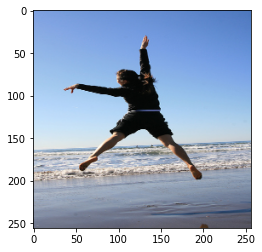

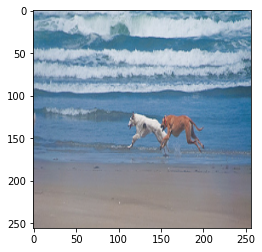

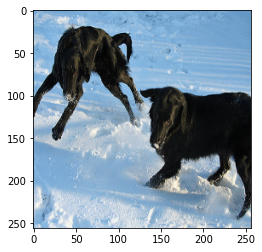

In [87]:
for x in final_df[final_df.cluster == 1].paths:
    plt.imshow(preprocess_img(x)[0])
    plt.show()

# Distance based on projection

In [48]:
projections_of_latents = projector.predict(loaded_latents, verbose=1)

18/18 [==============================] - 0s 6ms/step


In [135]:
projection_index = 0

cosine_dist = []
for l, p in zip(projections_of_latents, loaded.paths):
    cosine_dist.append( [ pairwise_distances([projections_of_latents[projection_index]], [l], metric = 'cosine')[0][0], p] )

NameError: name 'projections_of_latents' is not defined

In [134]:
sorted_cosine_dist = sorting(cosine_dist, False)

NameError: name 'cosine_dist' is not defined

In [133]:
sorted_cosine_dist

NameError: name 'sorted_cosine_dist' is not defined

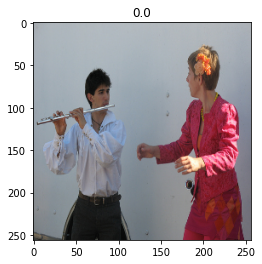

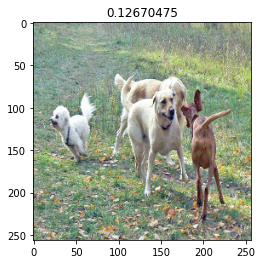

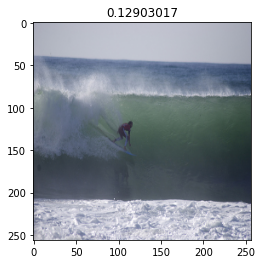

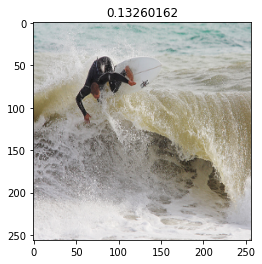

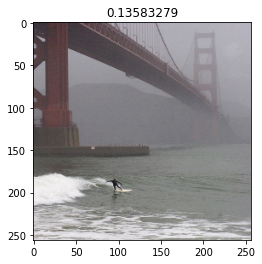

In [151]:
for i in sorted_cosine_dist[:5]:
    plt.title(i[0])
    plt.imshow(preprocess_img(i[1])[0])
    plt.show()

# Distance based on latents

In [133]:
latent_index = 0

eucliden_dist = []
for i, fl in zip(loaded_latents, loaded.paths):
    eucliden_dist.append([np.linalg.norm(loaded_latents[latent_index].flatten()-i.flatten()), i, fl])

In [148]:
sorted_eucliden_dist = sorting(eucliden_dist, False)

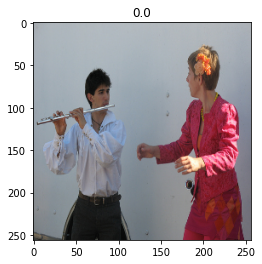

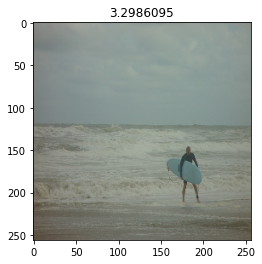

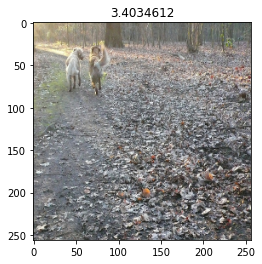

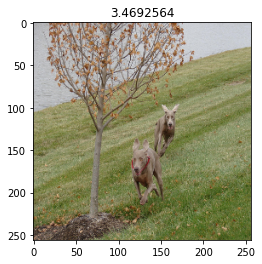

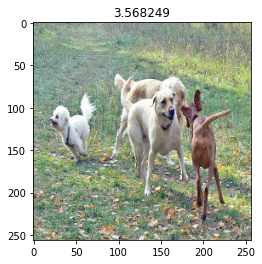

In [149]:
for i in sorted_eucliden_dist[:5]:
    # plt.imshow(decoder.predict(np.expand_dims(i[1],axis=0))[0])
    # plt.show()
    plt.title(i[0])
    plt.imshow(preprocess_img(i[2])[0])
    plt.show()

# Check that original embeddings of texts are correlated 

In [205]:
_i = 0

check_dist = []
for l, p in zip(descriptions_embeddings, X):
    check_dist.append( [ pairwise_distances([descriptions_embeddings[_i]], [l], metric = 'cosine')[0][0], p] )

In [206]:
sorted_check_dist = sorting(check_dist, False)

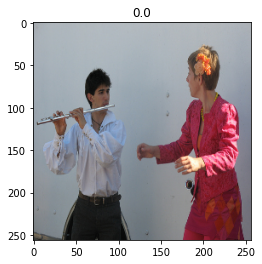

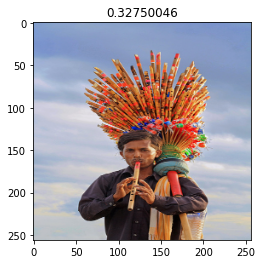

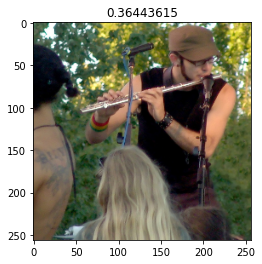

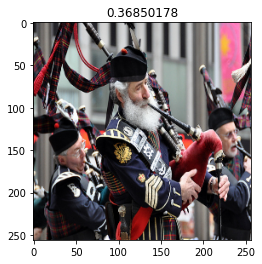

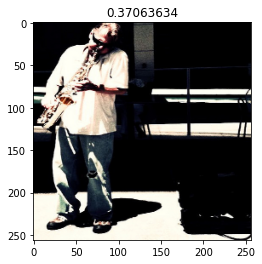

In [207]:
for i in sorted_check_dist[:5]:
     
    plt.title(i[0])
    plt.imshow(i[1])
    plt.show()

In [166]:
projection2_preds = projector2.predict(test_gen, verbose=1).astype(np.float64)

138/138 [==============================] - 11s 78ms/step


In [68]:
projection2_preds = ((projection2_preds - projection2_preds.mean()) / projection2_preds.std())

In [176]:
_i = 30

projection2_dist = []
for l, p in zip(projection2_preds, X):
    projection2_dist.append( [ pairwise_distances(np.array([projection2_preds[_i]]), np.array([l]), metric = 'cosine')[0][0], p] )

In [177]:
sorted_projection2_dist = sorting(projection2_dist, False)

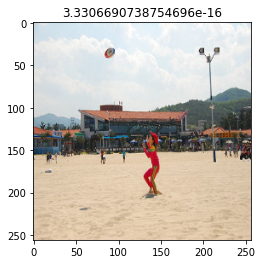

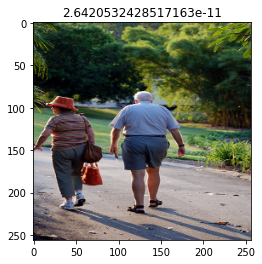

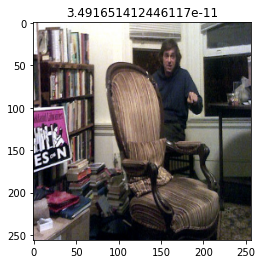

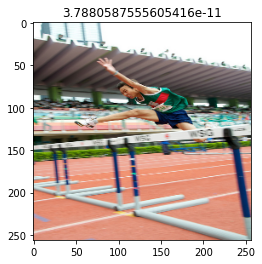

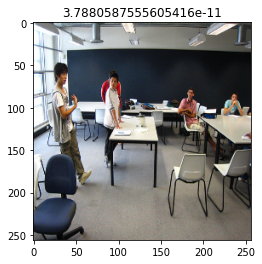

...

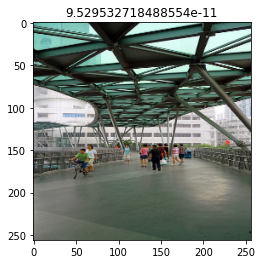

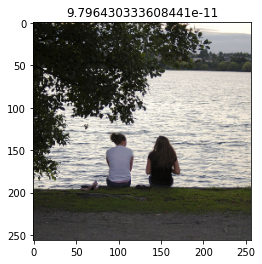

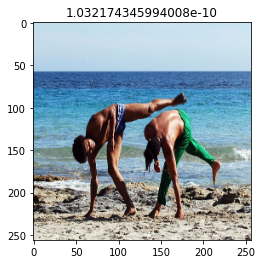

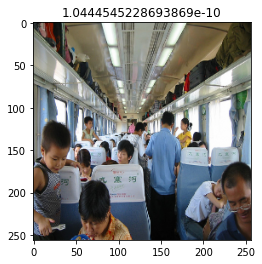

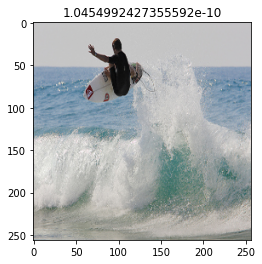

In [178]:
for i in sorted_projection2_dist[:20]:
     
    plt.title(i[0])
    plt.imshow(i[1])
    plt.show()